In [1]:
import os
cwd = os.getcwd().replace("\\", "/")
print(cwd)

/kaggle/working


In [2]:
import os
import pickle
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
from PIL import Image
import requests
import wandb
from sklearn.metrics import f1_score
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import torch.nn.functional as F
from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation,UperNetForSemanticSegmentation
from glob import glob
from albumentations import (
    HorizontalFlip,
    VerticalFlip,
    RandomRotate90,
    ShiftScaleRotate,
    RandomBrightnessContrast,
    CLAHE,
    HueSaturationValue,
    GaussNoise,
    GridDistortion,
    Compose,
    RandomCrop
)
import cv2
from torch.utils.data import ConcatDataset, DataLoader


BATCH_SIZE = 4

kaggle = True if cwd == "/kaggle/working" else False
data_path = "/kaggle/input/" if kaggle else cwd + "/../../data/"

#takes path of x and returns x and y as images
def get_label(x_path):
    x_path = x_path.replace("\\", "/")
    if x_path.__contains__("massachusetts"):
        y_path = x_path.replace("tiff/train/", "tiff/train_labels/").replace(".tiff", ".tif")

    if x_path.__contains__("ethz") or x_path.__contains__("googlemaps"):
        y_path = x_path.replace("images/", "groundtruth/")

    if x_path.__contains__("deepglobe"):
        y_path = x_path.replace("sat.jpg", "mask.png")

    return Image.open(x_path), Image.open(y_path)


def save(model, optim, name):
    path = ("/kaggle/working/" if kaggle else "") + name + ".pth"
    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optim.state_dict(),
    }, path)

def load(model, optim, name):
    path = ("/kaggle/working/" if kaggle else "") + name + ".pth"
    checkpoint = torch.load(path)
    model.load_state_dict(checkpoint['model_state_dict'])
    optim.load_state_dict(checkpoint['optimizer_state_dict'])

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

In [3]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import os
import logging

import torch
import torch.nn as nn
from torch.nn import *
from collections import OrderedDict

logger = logging.getLogger(__name__)

import warnings
warnings.filterwarnings("ignore")


class SegNetLite(nn.Module):

    def __init__(self, kernel_sizes=[3, 3, 3, 3], down_filter_sizes=[32, 64, 128, 256],
            up_filter_sizes=[128, 64, 32, 32], conv_paddings=[1, 1, 1, 1],
            pooling_kernel_sizes=[2, 2, 2, 2], pooling_strides=[2, 2, 2, 2], **kwargs):
        """Initialize SegNet Module

        Args:
            kernel_sizes (list of ints): kernel sizes for each convolutional layer in downsample/upsample path.
            down_filter_sizes (list of ints): number of filters (out channels) of each convolutional layer in the downsample path.
            up_filter_sizes (list of ints): number of filters (out channels) of each convolutional layer in the upsample path.
            conv_paddings (list of ints): paddings for each convolutional layer in downsample/upsample path.
            pooling_kernel_sizes (list of ints): kernel sizes for each max-pooling layer and its max-unpooling layer.
            pooling_strides (list of ints): strides for each max-pooling layer and its max-unpooling layer.
        """
        super(SegNetLite, self).__init__()
        self.num_down_layers = len(kernel_sizes)
        self.num_up_layers = len(kernel_sizes)

        input_size = 3 # initial number of input channels
        # Construct downsampling layers.
        # As mentioned in the assignment, blocks of the downsampling path should have the
        # following output dimension (igoring batch dimension):
        # 3 x 64 x 64 (input) -> 32 x 32 x 32 -> 64 x 16 x 16 -> 128 x 8 x 8 -> 256 x 4 x 4
        # each block should consist of: Conv2d->BatchNorm2d->ReLU->MaxPool2d
        layers_conv_down = [LazyConv2d(c,k,1,p) for (c,k,p) in zip(down_filter_sizes,kernel_sizes,conv_paddings)]
        layers_bn_down = [LazyBatchNorm2d() for _ in kernel_sizes]
        layers_pooling = [MaxPool2d(k,s,return_indices=True) for (k,s) in zip(pooling_kernel_sizes,pooling_strides)]
        # raise NotImplementedError('Downsampling layers are not implemented!')

        # Convert Python list to nn.ModuleList, so that PyTorch's autograd
        # package can track gradients and update parameters of these layers
        self.layers_conv_down = nn.ModuleList(layers_conv_down)
        self.layers_bn_down = nn.ModuleList(layers_bn_down)
        self.layers_pooling = nn.ModuleList(layers_pooling)

        # Construct upsampling layers
        # As mentioned in the assignment, blocks of the upsampling path should have the
        # following output dimension (igoring batch dimension):
        # 256 x 4 x 4 (input) -> 128 x 8 x 8 -> 64 x 16 x 16 -> 32 x 32 x 32 -> 32 x 64 x 64
        # each block should consist of: MaxUnpool2d->Conv2d->BatchNorm2d->ReLU
        layers_conv_up = [LazyConv2d(c,k,1,p) for (c,k,p) in zip(up_filter_sizes,kernel_sizes,conv_paddings)]
        layers_bn_up = [LazyBatchNorm2d() for _ in kernel_sizes]
        layers_unpooling = [MaxUnpool2d(k,s) for (k,s) in zip(pooling_kernel_sizes,pooling_strides)]
        # raise NotImplementedError('Upsampling layers are not implemented!')

        # Convert Python list to nn.ModuleList, so that PyTorch's autograd
        # can track gradients and update parameters of these layers
        self.layers_conv_up = nn.ModuleList(layers_conv_up)
        self.layers_bn_up = nn.ModuleList(layers_bn_up)
        self.layers_unpooling = nn.ModuleList(layers_unpooling)

        self.relu = nn.ReLU(True)

        # Implement a final 1x1 convolution to to get the logits of 11 classes (background + 10 digits)
        # raise NotImplementedError('Final convolution layer is not implemented!')
        self.final = LazyConv2d(1,1)

    def forward(self, x):
        indices = []

        for i in range(4):
            x = self.layers_conv_down[i](x)
            x = self.layers_bn_down[i](x)
            x = self.relu(x)
            x,ind = self.layers_pooling[i](x)
            indices.append(ind)

        for i in range(4):
            x = self.layers_unpooling[i](x,indices[3-i])
            x = self.layers_conv_up[i](x)
            x = self.layers_bn_up[i](x)
            x = self.relu(x)
        
        x = self.final(x)
        x = torch.sigmoid(x)
        return x
            



def get_seg_net(**kwargs):

    model = SegNetLite(**kwargs)

    return model

In [4]:
model = SegNetLite()
model = model.cuda()

In [5]:
model_name = "nvidia/segformer-b5-finetuned-ade-640-640"
feature_extractor:SegformerImageProcessor = SegformerImageProcessor.from_pretrained(model_name, size=400)

In [6]:
def get_geometric_transforms_official():
    geometric_transforms = [
        HorizontalFlip(p=0.5),
        VerticalFlip(p=0.5),
        RandomRotate90(p=0.5),
    ]
    return Compose(geometric_transforms, additional_targets={'mask':'image'})


def get_photometric_transforms():
    photometric_transforms = [
        RandomBrightnessContrast(p=0.5),
        CLAHE(p=0.5),
        HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.5),
        GaussNoise(p=0.5)
    ]
    return Compose(photometric_transforms)


return_orig_images = False
class CustomDataset(Dataset):
    def __init__(self, image_files, geometric_transform=None, photometric_transform=None):
        self.image_files = image_files
        self.geometric_transform = geometric_transform
        self.photometric_transform = photometric_transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        x_orig, y_orig = get_label(self.image_files[idx])

        x_orig:Image = x_orig.convert("RGB")
        y_orig:Image = y_orig.convert("RGB")

        if x_orig.size[0] == 1024:
            x_orig = x_orig.resize((400, 400))
            y_orig = y_orig.resize((400, 400))
        
        x_orig_np = np.array(x_orig, dtype=np.uint8)
        y_orig_np = np.array(y_orig, dtype=np.uint8)

        # Apply geometric transforms
        x_augmented, y_augmented = x_orig_np.copy(), y_orig_np.copy()
        if self.geometric_transform:
            augmented = self.geometric_transform(image=x_augmented.copy(), mask=y_augmented.copy())
            x_augmented, y_augmented = augmented['image'], augmented['mask']

        # Apply photometric transforms
        if self.photometric_transform:
            augmented = self.photometric_transform(image=x_augmented.copy())
            x_augmented = augmented['image']

        x = feature_extractor(images=x_augmented.astype(np.float32), return_tensors="pt").pixel_values.squeeze(0).cuda()
        y = torch.tensor((y_augmented.astype(np.float32)/255)[:, :, 0], dtype=torch.float32).unsqueeze(0).cuda()

        if return_orig_images:

            # ensure the orig images have the same size when the datasets are combined
            if x_orig_np.shape[0] == 1500:
                x_orig_np = np.array(Image.fromarray(x_orig_np).resize((400, 400)))
                y_orig_np = np.array(Image.fromarray(y_orig_np).resize((400, 400)))

            # Convert the images to float32
            x_orig_np = x_orig_np.astype(np.float32) / 255
            y_orig_np = y_orig_np.astype(np.float32) / 255
            x_augmented = x_augmented.astype(np.float32) / 255
            y_augmented = y_augmented.astype(np.float32) / 255



            return x, y, self.image_files[idx], x_orig_np, y_orig_np, x_augmented, y_augmented
        
        else:
            return x, y, self.image_files[idx], torch.zeros(1), torch.zeros(1), torch.zeros(1), torch.zeros(1)

In [7]:
main_dataset_len = len(glob(data_path + "ethz-cil-road-segmentation-2023/training/images/*.png"))

# Split the dataset
val_size = int(main_dataset_len * 0.2)
train_size = main_dataset_len - val_size
torch.manual_seed(0)
indices = torch.randperm(main_dataset_len).tolist()
train_indices = indices[:train_size]
val_indices = indices[train_size:]

# Apply transformations only on training set
train_dataset = CustomDataset(np.array(glob(data_path + "ethz-cil-road-segmentation-2023/training/images/*.png"))[train_indices], None, None)
train_dataset_augmented = CustomDataset(np.array(glob(data_path + "ethz-cil-road-segmentation-2023/training/images/*.png"))[train_indices], get_geometric_transforms_official(), get_photometric_transforms())
val_dataset = CustomDataset(np.array(glob(data_path + "ethz-cil-road-segmentation-2023/training/images/*.png"))[val_indices], None, None)
val_dataset_augmented = CustomDataset(np.array(glob(data_path + "ethz-cil-road-segmentation-2023/training/images/*.png"))[val_indices], get_geometric_transforms_official(), get_photometric_transforms())

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
train_loader_augmented = DataLoader(train_dataset_augmented, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
val_loader_augmented = DataLoader(val_dataset_augmented, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

In [8]:
def visualize_sample(model, loader, rows=4):
    global return_orig_images
    return_orig_images = True
    with torch.no_grad():
        fig, ax = plt.subplots(rows, 5, figsize=(40, 40))
        for i, (x, y, name, x_orig, y_orig, x_augmented, y_augmented) in enumerate(loader):
            x = x[0]
            y = y[0]
            name = name[0]
            x_orig = x_orig[0]
            y_orig = y_orig[0]
            x_augmented = x_augmented[0]
            y_augmented = y_augmented[0]

            pred = model(x.unsqueeze(0)).squeeze(0)

            pred = F.sigmoid(pred).permute(1, 2, 0).cpu().numpy()
            y = y.permute(1, 2, 0).cpu().numpy()
            x = x.permute(1, 2, 0).cpu().numpy()

            ax[i][0].imshow(x_orig)
            ax[i][1].imshow(y_orig)
            ax[i][2].imshow(x_augmented)
            ax[i][3].imshow(y_augmented)
            ax[i][4].imshow(pred, cmap='gray')
            

            if i == rows - 1:
                break
            
    return_orig_images = False

In [9]:
optimizer = optim.AdamW(model.parameters(), lr=1e-4)
criterion = nn.BCEWithLogitsLoss()

In [10]:
use_wandb = False

def train(model, dataset, optimizer):
    model.train()
    total_loss = 0
    steps = 0
    for x, y, _a, _b, _c, _d, _e in tqdm(dataset):
        x, y = x.cuda(), y.cuda()     
        optimizer.zero_grad()
        y_pred = model(x)
        # y_pred = torch.repeat_interleave(torch.repeat_interleave(y_pred, 2, dim=2), 2, dim=3)
        # y_pred = torch.repeat_interleave(torch.repeat_interleave(y_pred, 2, dim=2), 2, dim=3)
        loss = criterion(y_pred, y)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        steps += 1
        if steps % 100 == 0:
            print("Training Loss:", total_loss / steps)
            if use_wandb: wandb.log({"Train Loss": total_loss / steps})

    print("Training Loss:", total_loss / len(dataset))
    if use_wandb: wandb.log({"Train Loss": total_loss / len(dataset)})

In [11]:
def validate(model, dataset):
    model.eval()
    y_preds = np.array([], dtype=np.float32)
    y_gt = np.array([], dtype=np.float32)
    with torch.no_grad():
        for x, y, _a, _b, _c, _d, _e in dataset:
            x, y = x.cuda(), y.cuda()  
            # print(x.shape , y.shape)
            y_pred = model(x)
            y_pred = torch.sigmoid(y_pred)

            # apply pooling to reduce the prediction from 400x400 to 25x25
            y_pred = F.avg_pool2d(y_pred, 16, stride=16)
            # apply pooling to reduce the label from 400x400 to 25x25
            y = F.avg_pool2d(y, 16, stride=16)

            y_preds = np.concatenate((y_preds, y_pred.cpu().numpy().flatten()))
            y_gt = np.concatenate((y_gt, y.cpu().numpy().flatten()))
            
            
    y_preds = np.array(y_preds)
    y_gt = np.array(y_gt)
    for tresh in np.arange(0.15,0.40,0.05):        
        score = f1_score(y_gt>0.25, y_preds > tresh)
        print("Validation F1 Score for tresh",tresh,":", score)
        if use_wandb: wandb.log("Validation F1 Score for tresh "+str(tresh) +": " + str(score))

In [12]:
for epoch in range(30):
    train(model, train_loader, optimizer)
    validate(model, val_loader)

save(model, optimizer, "model_train_e-4")

100%|██████████| 29/29 [00:11<00:00,  2.59it/s]


Training Loss: 0.8953458646248127
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.62it/s]


Training Loss: 0.8798188875461447
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.64it/s]


Training Loss: 0.8725357569497207
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.14it/s]


Training Loss: 0.8676365285084165
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.65it/s]


Training Loss: 0.8628247462469956
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.63it/s]


Training Loss: 0.8537510057975506
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.59it/s]


Training Loss: 0.8409575737755874
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.62it/s]


Training Loss: 0.8293841419548824
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.70it/s]


Training Loss: 0.820454190517294
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.19it/s]


Training Loss: 0.8144642011872654
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.72it/s]


Training Loss: 0.8086956595552379
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.67it/s]


Training Loss: 0.8040050740899711
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.61it/s]


Training Loss: 0.7989782999301779
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.63it/s]


Training Loss: 0.7941606887455644
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.75it/s]


Training Loss: 0.7896307891812818
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  5.96it/s]


Training Loss: 0.7845571205533785
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.68it/s]


Training Loss: 0.7816226749584593
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.58it/s]


Training Loss: 0.777961176017235
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.63it/s]


Training Loss: 0.7742552120110084
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.67it/s]


Training Loss: 0.7693859379867027
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.68it/s]


Training Loss: 0.7670438597942221
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.16it/s]


Training Loss: 0.7614470617524509
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.59it/s]


Training Loss: 0.7584607087332627
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.69it/s]


Training Loss: 0.7550137597939064
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.58it/s]


Training Loss: 0.7514199861164751
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.74it/s]


Training Loss: 0.7482620046056551
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.61it/s]


Training Loss: 0.7467838731305353
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.18it/s]


Training Loss: 0.7421633930041872
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.61it/s]


Training Loss: 0.7397050610904036
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.65it/s]


Training Loss: 0.7363498704186802
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


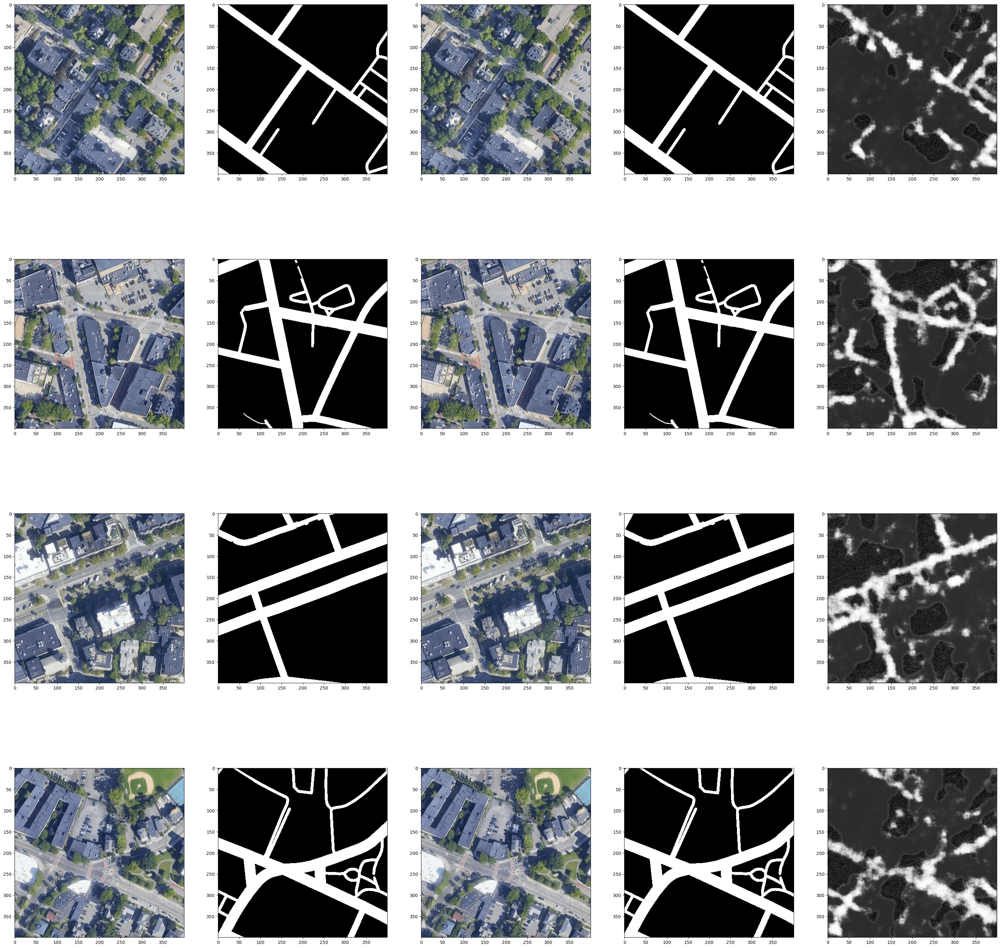

In [13]:
visualize_sample(model, val_loader)

100%|██████████| 29/29 [00:04<00:00,  6.59it/s]


Training Loss: 0.7333421583833366
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.21it/s]


Training Loss: 0.7326626161049152
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.54it/s]


Training Loss: 0.7332555507791454
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.61it/s]


Training Loss: 0.7327005965956326
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


100%|██████████| 29/29 [00:04<00:00,  6.58it/s]


Training Loss: 0.7318637494383187
Validation F1 Score for tresh 0.15 : 0.3736815203754473
Validation F1 Score for tresh 0.2 : 0.3736815203754473
Validation F1 Score for tresh 0.25 : 0.3736815203754473
Validation F1 Score for tresh 0.30000000000000004 : 0.3736815203754473
Validation F1 Score for tresh 0.3500000000000001 : 0.3736815203754473


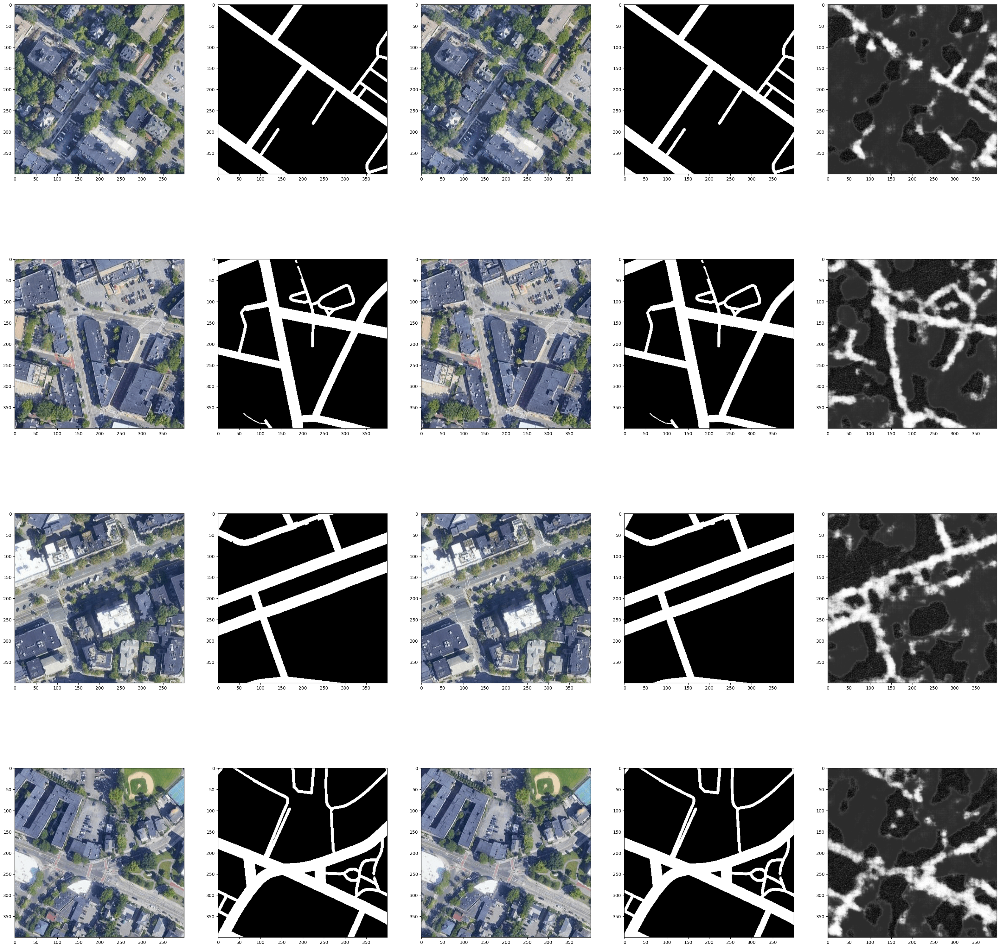

In [14]:
optimizer.param_groups[0]['lr'] = 1e-5

for epoch in range(3):
    train(model, train_loader, optimizer)
    validate(model, val_loader)

save(model, optimizer, "model_train_e-5")

optimizer.param_groups[0]['lr'] = 1e-6

for epoch in range(2):
    train(model, train_loader, optimizer)
    validate(model, val_loader)

save(model, optimizer, "model_train_e-6")

visualize_sample(model, val_loader)

if use_wandb: wandb.finish()

In [15]:
load(model, optimizer, "model_train_e-6")

In [16]:
def save_image(data, cm, fn):
   
    sizes = np.shape(data)
    height = float(sizes[0])
    width = float(sizes[1])
     
    fig = plt.figure()
    fig.set_size_inches(width/height, 1, forward=False)
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)
 
    ax.imshow(data, cmap=cm)
    plt.savefig(fn, dpi = height) 
    plt.close()

In [17]:
model.eval()
with torch.no_grad():
    test_path = data_path + "ethz-cil-road-segmentation-2023/" + "test/images/"    

    files = os.listdir(test_path)
    for file in tqdm(files):
        x_orig:Image = Image.open(test_path + file).convert("RGB")
        x_orig = np.array(x_orig, dtype=np.float32)
        # print(x_orig.shape)
        x = feature_extractor(images=x_orig, return_tensors="pt").pixel_values.squeeze(0).cuda()
        # print(x.shape)
        # print(x.unsqueeze(0).shape)
        pred = model(x.unsqueeze(0)).squeeze(0)
        pred = F.sigmoid(pred).permute(1, 2, 0).cpu().numpy()
        # print(pred.shape) # (400, 400, 1)
        pred = pred.squeeze(-1)
        # print(pred.shape) # (400, 400)
        # pred = Image.fromarray((pred*255).astype(np.uint8))
        pred = pred*255

        # output_dir = "/kaggle/working/pred/"
        output_dir = "/kaggle/working/pred/" if kaggle else data_path + "ethz-cil-road-segmentation-2023/test/pred/"

        #make the folder
        if not os.path.exists(output_dir):
            os.makedirs(output_dir)
        
        #pred.save(output_dir + file)
        save_image(pred, 'gray', output_dir + file)

100%|██████████| 144/144 [00:19<00:00,  7.40it/s]


In [18]:
import shutil
shutil.make_archive("/kaggle/working/pred", 'zip', output_dir)

'/kaggle/working/pred.zip'